In [ ]:
import numpy as np
import h5py
import os
import sys
import time
from scipy.ndimage import gaussian_filter1d as gf1d
import matplotlib.pyplot as plt
from scipy.fft import fft2, ifft2, fftshift, ifftshift

In [ ]:
import psutil
def Memory_Usage():
    process = psutil.Process(os.getpid())
    memory_usage_GB = process.memory_info().rss / 1024 ** 3  # in GB
    print(f'Memory Usage: {memory_usage_GB:.4g}GB')

In [ ]:
# Credits to https://stackoverflow.com/questions/51548551/reading-nested-h5-group-into-numpy-array
# tansverse_datasets(hdf_file) will transfer hdf_file to datasets (usable datasets which can be transferred to np-array)
def traverse_datasets(hdf_file):

    def h5py_dataset_iterator(g, prefix=''):
        for key in g.keys():
            item = g[key]
            path = f'{prefix}/{key}'
            if isinstance(item, h5py.Dataset): # test for dataset
                yield (path, item)
            elif isinstance(item, h5py.Group): # test for group (go down)
                yield from h5py_dataset_iterator(item, path)

    for path, _ in h5py_dataset_iterator(hdf_file):
        yield path

def display_images(images, Sub_titles = None, fig_name = 'displayed_images.png', dpi = 100, images_per_row=15):
    """
    Display images in a grid, with a specified number of images per row.

    Parameters:
    images (ndarray): The ndarray containing the images, with shape (n, height, width).
    images_per_row (int): The number of images to display per row.
    """
    num_images = images.shape[0]
    num_cols = images_per_row
    num_rows = int(np.ceil(num_images / num_cols))

    # Create a figure with the specified size
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols*3, num_rows * 3))

    # Flatten axes array for easy iteration
    axes = axes.flatten()

    # Iterate through images and plot them
    for i in range(num_images):
        axes[i].imshow(images[i], cmap='plasma', vmin = 0, vmax = 2)  # Assuming grayscale images
        if Sub_titles:
            axes[i].set_title(f'index = {i}, {Sub_titles[i]}')
        else:
            axes[i].set_title(f'index = {i}')
        axes[i].axis('off')  # Hide axes for better visualization

    # Hide any remaining empty subplots
    for i in range(num_images, num_rows * num_cols):
        axes[i].axis('off')

    # Adjust layout
    plt.tight_layout()
    # plt.savefig(fig_name, dpi = dpi)
    plt.show()

In [ ]:
!pwd

In [93]:
work_dir = "/das/work/units/maloja/p21108/Hankai/MalojaCDI/scripts"
sys.path.append(work_dir)
import CMC
import bad_pixel
import parameters
import find_center
import importlib
importlib.reload(CMC)
importlib.reload(find_center)

<module 'find_center' from '/das/work/units/maloja/p21108/Hankai/MalojaCDI/scripts/find_center.py'>

In [ ]:
JFMask = np.load('JFMask.npy')

def Preprocess(pattern, bkg, JFMask):

    # Prepare Mask, identify non-response pixels and hot pixels
    SpecificMask = pattern == 0
    BadPixMask = bad_pixel.abnormal_pixels(pattern, JFMask|SpecificMask)
    final_mask = JFMask|SpecificMask|BadPixMask

    # Background subtraction
    img_minus_bkg = (pattern - bkg)*(~final_mask)

    # Common Mode Correction
    img_cmc = CMC.ComModCor_single(img_minus_bkg)[0]
    
    # Center Finding
    center_shift = find_center.Auto_Find_Center(img_minus_bkg, final_mask)[1]
    center = np.array(img_minus_bkg.shape)//2 + center_shift

    return img_cmc, center, final_mask


In [ ]:
data_dir = '/sf/maloja/data/p19750/work/PreData'
Runs = [Run for Run in sorted(os.listdir(data_dir)) if (Run[:3]=='Run' and Run.endswith('.h5'))]
for run_name in Runs:
    print(run_name)

In [ ]:
# NaCl 25mM 1.5mJ Pulse DUration 100fs Photon Energy Scan from 1055eV to 1085eV
runs_of_interest = [115, 116, 117, 118, 119, 120, 122]
bkg_file = os.path.join(data_dir, 'Background_NaCl_25mM.h5')
# runs_of_interest = [123+i for i in range(7)]
# bkg_file = os.path.join(data_dir, 'Background_NaCl_25mM_ShorterPulse.h5')
# runs_of_interest = [155, 157, 159, 160]
# bkg_file = os.path.join(data_dir, 'Background_NaI_50mM_Ethanol.h5')

FileNames = [run_name for run_name in Runs if int(run_name[4:8]) in runs_of_interest]
print(FileNames)
h5Files = [os.path.join(data_dir, file_name) for file_name in FileNames]


In [ ]:
Delay_Steps1 = [100*i for i in range(21)]
Acq_File1 = '/sf/maloja/data/p19750/work/analysis/zhibin/CoreShell/Run_0368.h5'
Bkg_File1 = '/sf/maloja/data/p19750/work/analysis/zhibin/CoreShell/BG_Run_0368.h5'
Delay_Steps2 = [-20+10*i for i in range(23)]
Acq_File2 = '/sf/maloja/data/p19750/work/analysis/zhibin/CoreShell/Run_0370.h5'
Bkg_File2 = '/sf/maloja/data/p19750/work/analysis/zhibin/CoreShell/BG_Run_0370.h5'
Delay_Steps3 = [-3+1*i for i in range(34)]
Acq_File3 = '/sf/maloja/data/p19750/work/analysis/zhibin/CoreShell/Run_0374.h5'
Bkg_File3 = '/sf/maloja/data/p19750/work/analysis/zhibin/CoreShell/BG_Run_0374.h5'
Delay_Steps4 = [-1+0.1*i for i in range(31)]
Acq_File4 = '/sf/maloja/data/p19750/work/analysis/zhibin/CoreShell/Run_0375.h5'
Bkg_File4 = '/sf/maloja/data/p19750/work/analysis/zhibin/CoreShell/BG_Run_0375.h5'
Acq_Files = [Acq_File1,Acq_File2,Acq_File3,Acq_File4]
Bkg_Files = [Bkg_File1,Bkg_File2,Bkg_File3,Bkg_File4]

In [ ]:
with h5py.File(bkg_file, 'r') as bkgf:
    Bkgs = np.array(bkgf['/jungfrau/pattern'])
    bkg = Bkgs.mean(0)
    print(bkg.shape)

plt.title('Background')
plt.imshow(bkg, vmin = -1, vmax = 1, cmap = 'bwr')
plt.show()

In [ ]:
# Run115-122, NaCl 100fs XFEL
Avg_Sizes = np.load('/sf/maloja/data/p19750/work/analysis/Hankai/GetSizeZhibin/Run115-122/avg_sizes.npy', allow_pickle=True)
labels = np.load('/sf/maloja/data/p19750/work/analysis/Hankai/GetSizeZhibin/Run115-122/labels.npy', allow_pickle=True)
Ints = np.load('/sf/maloja/data/p19750/work/analysis/Hankai/GetSizeZhibin/Run115-122/Ints.npy', allow_pickle=True)
Is_Particle = np.load('/sf/maloja/data/p19750/work/analysis/Hankai/GetSizeZhibin/Run115-122/is_particle.npy', allow_pickle=True)
PulseEs = np.load('/sf/maloja/data/p19750/work/analysis/Hankai/GetSizeZhibin/Run115-122/pulseE.npy', allow_pickle=True)
avg_sizes = np.array([np.nan if s is None else s for s in Avg_Sizes], dtype=float)

In [ ]:
# print(Avg_Sizes != None)
plt.hist(Avg_Sizes[Avg_Sizes!=None], bins= 100)
plt.show()

selected_indices = (labels == unique_label) & (Avg_Sizes != None) & (avg_sizes < 250) & (avg_sizes > 60)


In [ ]:
# Pilot First Week Data

PhotonEs = [1055 + 5*i for i in range(len(h5Files))]
# PhotonEs = [610 + 10*i for i in range(len(h5Files))]

print(h5Files)


image_index = 0

for h5file in h5Files[:1]:
    with h5py.File(h5file, 'r') as f:
        ds = f['/jungfrau/pattern']
        for img in ds[:10]:
            Memory_Usage()

            start = time.time()

            pattern = img
            
            # Prepare Mask, identify non-response pixels and hot pixels
            SpecificMask = pattern == 0
            BadPixMask = bad_pixel.abnormal_pixels(pattern, JFMask|SpecificMask)
            final_mask = JFMask|SpecificMask|BadPixMask
        
            # Background subtraction
            img_minus_bkg = (pattern - bkg)*(~final_mask)
        
            # Common Mode Correction
            img_cmc = CMC.ComModCor_single(img_minus_bkg)[0]
            
            # Center Finding
            asymmetry, center_shift = find_center.find_center_minimize_asymmetry(img_cmc, final_mask, cropsize = 1000)
            # asymmetry, center_shift = find_center.Auto_Find_Center_4(img_cmc, final_mask)
            # asymmetry, center_shift = find_center.Auto_Find_Center(img_cmc, final_mask)

            center = np.array(img_cmc.shape)//2 + center_shift
            print(f'center shift (Δy, Δx) by 4 quarters = {center_shift}')
            # print(f'center shift (Δy, Δx) by 2 quarters = {center_shift_}')

            fig, axs = plt.subplots(1, 3, figsize=(20, 7))  # Adjust figsize for better layout
            
            # Plot data on each subplot
            axs[0].imshow(img_cmc, cmap='bwr', vmin = -3, vmax = 3)
            axs[0].set_title("Original Image")
            print(asymmetry.shape)
            axs[1].imshow(np.log(asymmetry), extent=[-15, 15, -15, 15])
            axs[1].set_xticks(np.arange(-15, 16, 5))
            axs[1].set_yticks(np.arange(-15, 16, 5))
            axs[1].set_yticklabels(np.arange(-15, 16, 5)[::-1])     # Reverse the labels on the y-axis
        
            axs[1].set_title("Asymmetry as a function of center shift")
            Cropsize = 801
            img_center_y, img_center_x = center
            # print(f'center: {center}')
            half_cropsize = Cropsize // 2
        
            # Calculate cropping boundaries to keep the image center
            x_start = max(img_center_x - half_cropsize, 0)
            x_end = min(img_center_x + half_cropsize, img_cmc.shape[1])
            y_start = max(img_center_y - half_cropsize, 0)
            y_end = min(img_center_y + half_cropsize, img_cmc.shape[0])
        
            # Crop the image
            cropped_img = img_cmc[y_start:y_end, x_start:x_end]
        
            # Adjust center for cropping boundaries
            circle_center_y, circle_center_x = np.array([Cropsize, Cropsize])//2
            Num_Circ = 5
            
            axs[2].imshow(cropped_img, cmap='bwr', vmin = -3, vmax = 3)
            # axs[2].autoscale()
            axs[2].set_title("Complete image after filling the missing quarter")
        
            for i in range(Num_Circ):
                radius = half_cropsize * (Num_Circ - i) / Num_Circ - 20
                circle = plt.Circle((circle_center_y, circle_center_x), radius, color='green', fill=False)
                axs[2].add_patch(circle)
            
            # Adjust layout for better spacing
            plt.tight_layout()
            
            # Show the plot
            plt.show()

            end = time.time()
            print(f'Time consumption for one center finding process is {end - start}s')
            



In [ ]:
# Pilot Dynamic Data

def Preprocess3(pattern, bkg, JFMask):

    # Prepare Mask, identify non-response pixels and hot pixels
    SpecificMask = pattern == 0
    GeoMask = ~(parameters.Quarter1|parameters.Quarter4|parameters.Quarter3)
    BadPixMask = bad_pixel.abnormal_pixels(pattern, JFMask|GeoMask|SpecificMask)
    final_mask = JFMask|SpecificMask|GeoMask|BadPixMask

    # Background subtraction
    img_minus_bkg = (pattern - bkg)*(~final_mask)

    # Common Mode Correction
    img_cmc = CMC.ComModCor_single(img_minus_bkg)[0]
    
    # Center Finding
    # asymmetry, center_shift = find_center.find_center_minimize_asymmetry(img_cmc, final_mask, cropsize=800)
    # center = np.array(pattern.shape)//2 + center_shift

    # return img_cmc, asymmetry, center_shift, final_mask

    # center, centers = find_center.iterative_center_of_mass(img_cmc, final_mask, cropsize=2048)
    center, centers = find_center.iterative_phase_correlation(img_cmc, final_mask, cropsize=2048)

    return img_cmc, centers, center, final_mask

image_index = 0

for j, (Acq_File, Bkg_File) in enumerate(zip(Acq_Files, Bkg_Files)):
    print(f'Acquisition file {j}: {Acq_File}')
    bkg = 0 # initialization
    with h5py.File(Bkg_File, 'r') as bkgs:
        bkg = np.array(bkgs['/bg/image']).mean(0)
    
    with h5py.File(Acq_File, 'r') as acq:
        num_steps = acq['/LXT/LXT_Scan'].shape[0]
        for i in range(0, num_steps):
            print(f'{i}/{num_steps}')
            pattern_str = f'/jungfrau/pattern_{i}'
            pulseE_str = f'/gmd/pulse_ene_{i}'
            jf_images = acq[pattern_str]   # load jungfrau data

            for jf_img in jf_images:

                start = time.time()
                
                # img_cmc, asymmetry, center_shift, final_mask = Preprocess3(jf_img, bkg, JFMask)
                # center = np.array(img_cmc.shape)//2 + center_shift
                # print(f'center shift (Δy, Δx) by 4 quarters = {center_shift}')
                # print(f'centera shift (Δy, Δx) by 2 quarters = {center_shift_}')                
                img_cmc, centers, center, final_mask = Preprocess3(jf_img, bkg, JFMask)
                if np.sum(img_cmc > 1)/(img_cmc.shape[0]*img_cmc.shape[1]) < 0.01:
                    continue
                if center is None:
                    print('Cannot identify the center with iterative center of mass method')
                    center = centers[-1]
                print(f'center shift (Δy, Δx) by iterative center of mass method = {center-centers[0]}')
                
                
                Memory_Usage()
    
                

    
                fig, axs = plt.subplots(1, 3, figsize=(20, 7))  # Adjust figsize for better layout
                
                # Plot data on each subplot
                axs[0].imshow(img_cmc, cmap='bwr', vmin = -3, vmax = 3)
                axs[0].set_title("Original Image")
                # print(asymmetry.shape)
                # axs[1].imshow(np.log(asymmetry), extent=[-20, 20, -20, 20])
                # axs[1].set_xticks(np.arange(-20, 21, 5))
                # axs[1].set_yticks(np.arange(-20, 21, 5))
                # axs[1].set_yticklabels(np.arange(-20, 21, 5)[::-1])     # Reverse the labels on the y-axis
            

                centers = np.asarray(centers, dtype=float) - centers[0]
                ys, xs = centers[:, 0], centers[:, 1]
            
                # Draw the path
                axs[1].plot(xs, ys, '-o', label='Path')
                # Mark start and end
                axs[1].scatter(xs[0], ys[0], s=100, marker='s', label='Start')
                axs[1].scatter(xs[-1], ys[-1], s=100, marker='*', label='End')
                axs[1].set_title('center converging path of iterative center-of-mass method')

                
                Cropsize = 801
                img_center_y, img_center_x = center
                img_center_y, img_center_x = int(round(img_center_y)), int(round(img_center_x))
                # print(f'center: {center}')
                half_cropsize = Cropsize // 2
            
                # Calculate cropping boundaries to keep the image center
                x_start = max(img_center_x - half_cropsize, 0)
                x_end = min(img_center_x + half_cropsize, img_cmc.shape[1])
                y_start = max(img_center_y - half_cropsize, 0)
                y_end = min(img_center_y + half_cropsize, img_cmc.shape[0])
            
                # Crop the image
                cropped_img = img_cmc[y_start:y_end, x_start:x_end]
            
                # Adjust center for cropping boundaries
                circle_center_y, circle_center_x = np.array([Cropsize, Cropsize])//2
                Num_Circ = 5
                
                axs[2].imshow(cropped_img, cmap='bwr', vmin = -3, vmax = 3)
                # axs[2].autoscale()
                axs[2].set_title("Complete image after filling the missing quarter")
            
                for i in range(Num_Circ):
                    radius = half_cropsize * (Num_Circ - i) / Num_Circ - 20
                    circle = plt.Circle((circle_center_y, circle_center_x), radius, color='green', fill=False)
                    axs[2].add_patch(circle)
                
                # Adjust layout for better spacing
                plt.tight_layout()
                
                # Show the plot
                plt.show()
    
                end = time.time()
                print(f'Time consumption for one center finding process is {end - start}s')
                



Acquisition file 0: /sf/maloja/data/p19750/work/analysis/zhibin/CoreShell/Run_0368.h5
0/21
0
Reload
center shift (Δy, Δx) by iterative center of mass method = [ 0.5 16. ]
Memory Usage: 4.81GB


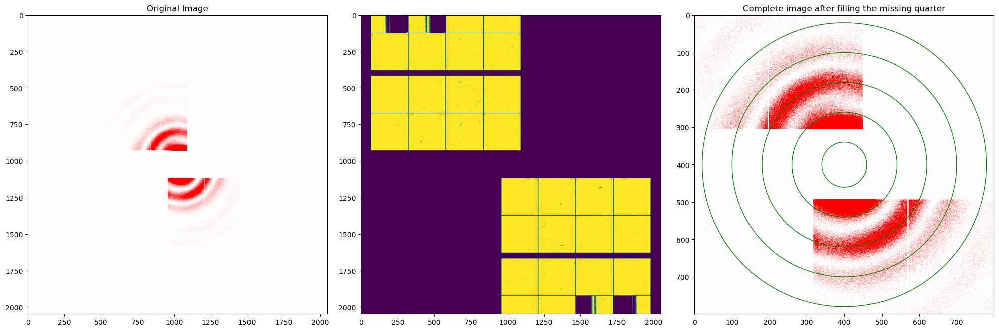

Time consumption for one center finding process is 6.8214380741119385s
1
Reload
2
Reload
3
Reload
center shift (Δy, Δx) by iterative center of mass method = [2.5 5.5]
Memory Usage: 4.809GB


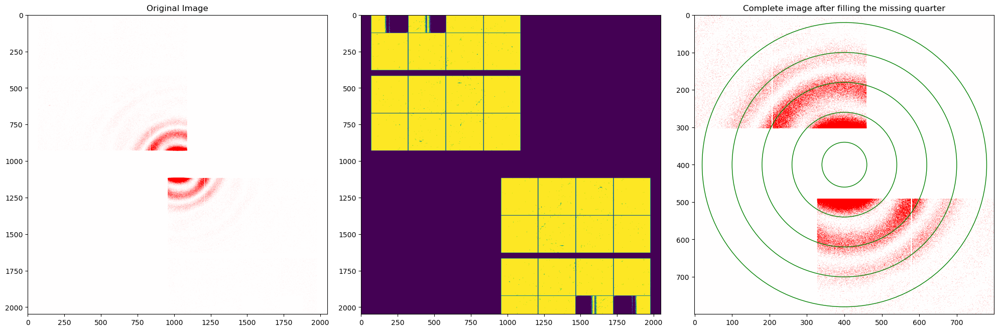

Time consumption for one center finding process is 6.82479190826416s
4
Reload
center shift (Δy, Δx) by iterative center of mass method = [-1.   1.5]
Memory Usage: 4.749GB


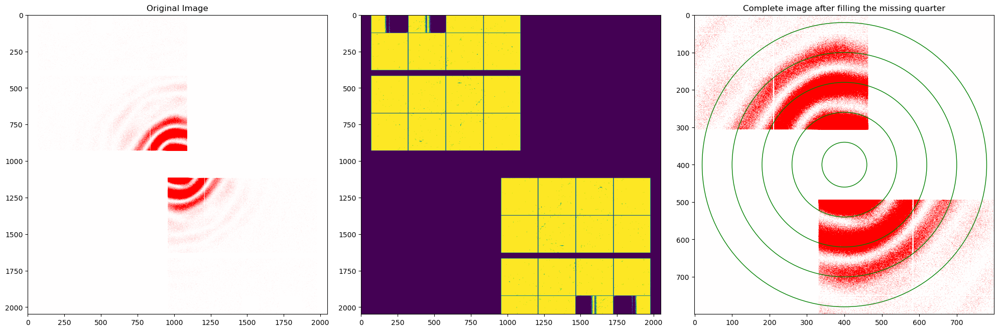

Time consumption for one center finding process is 6.767496824264526s
5
Reload
center shift (Δy, Δx) by iterative center of mass method = [3.5 5.5]
Memory Usage: 4.75GB


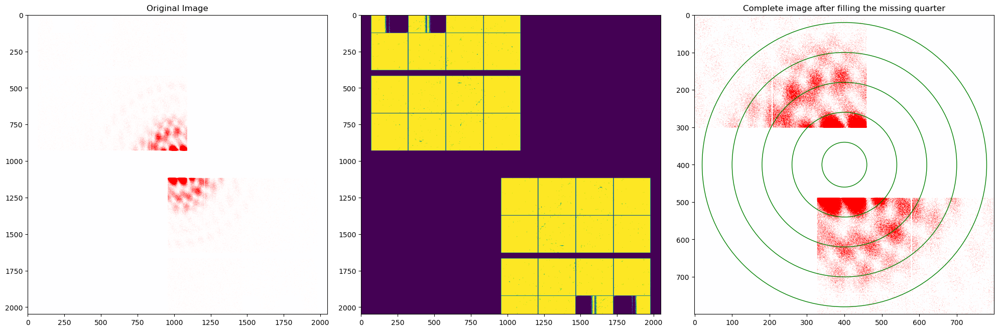

Time consumption for one center finding process is 7.318877935409546s
6
Reload
center shift (Δy, Δx) by iterative center of mass method = [-1.  2.]
Memory Usage: 4.749GB


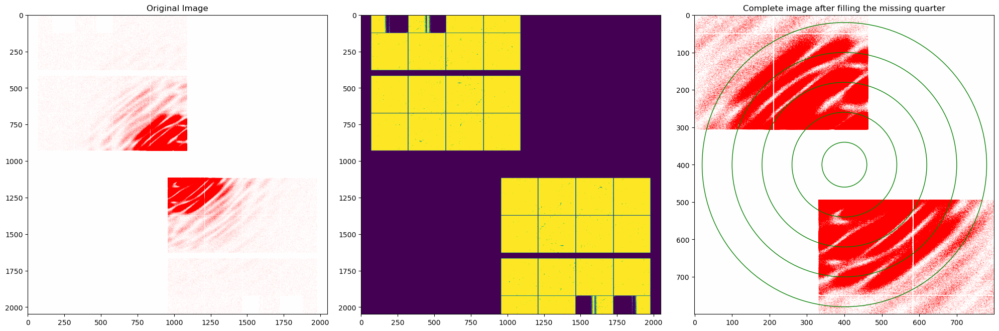

Time consumption for one center finding process is 6.7150187492370605s
7
Reload
8
Reload
9
Reload
10
Reload
center shift (Δy, Δx) by iterative center of mass method = [2.  8.5]
Memory Usage: 4.75GB


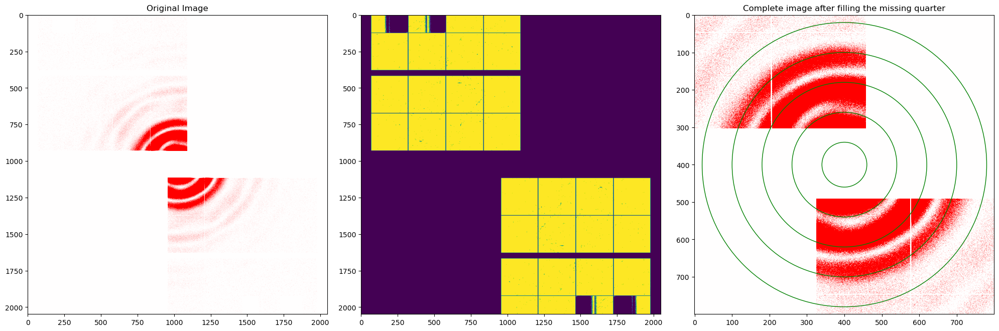

Time consumption for one center finding process is 6.706617832183838s
11
Reload
12
Reload
center shift (Δy, Δx) by iterative center of mass method = [-2. 12.]
Memory Usage: 4.749GB


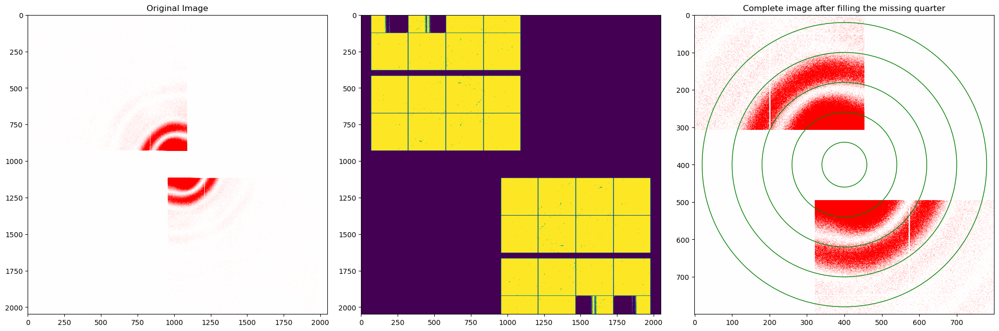

Time consumption for one center finding process is 6.639111042022705s
13
Reload
14
Reload
15
Reload
16
Reload
center shift (Δy, Δx) by iterative center of mass method = [ 2.5 11. ]
Memory Usage: 4.749GB


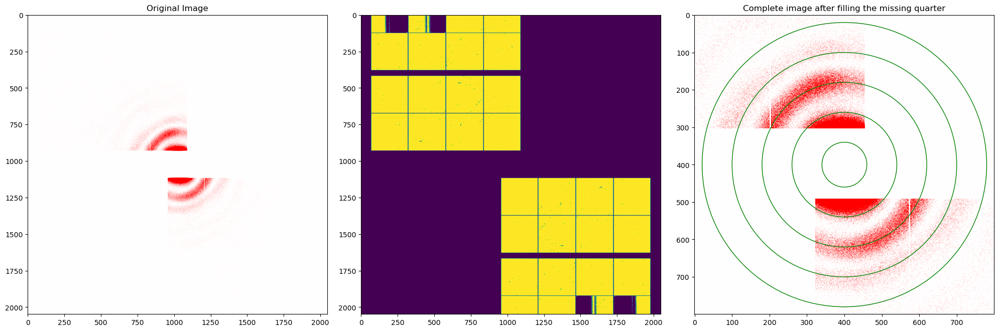

Time consumption for one center finding process is 6.6881420612335205s
17
Reload
center shift (Δy, Δx) by iterative center of mass method = [4.5 7.5]
Memory Usage: 4.749GB


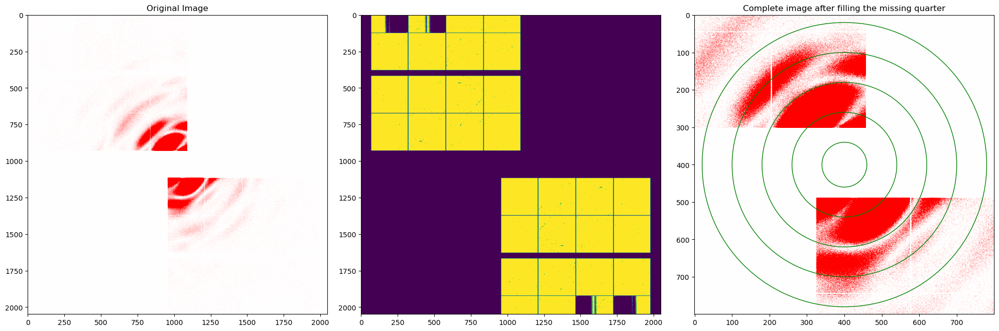

Time consumption for one center finding process is 6.6901469230651855s
18
Reload
center shift (Δy, Δx) by iterative center of mass method = [-2.  10.5]
Memory Usage: 4.75GB


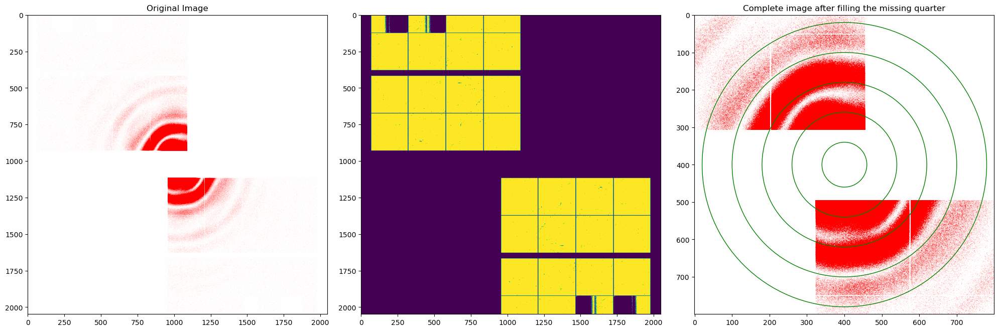

Time consumption for one center finding process is 6.638796329498291s
19
Reload
center shift (Δy, Δx) by iterative center of mass method = [2. 2.]
Memory Usage: 4.749GB


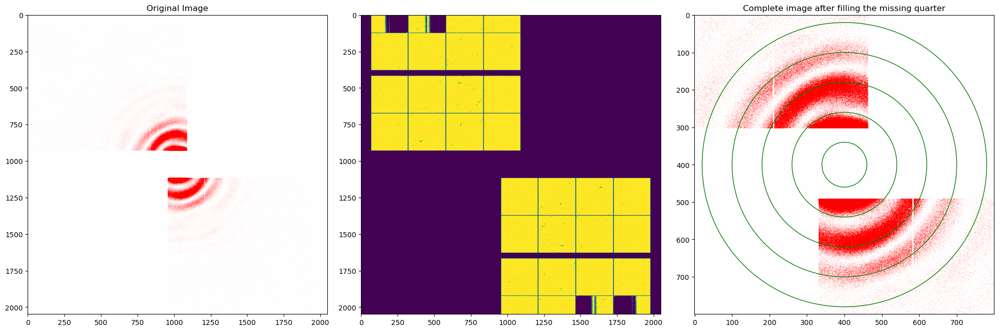

Time consumption for one center finding process is 6.677955389022827s
20
Reload
center shift (Δy, Δx) by iterative center of mass method = [2.5 7.5]
Memory Usage: 4.749GB


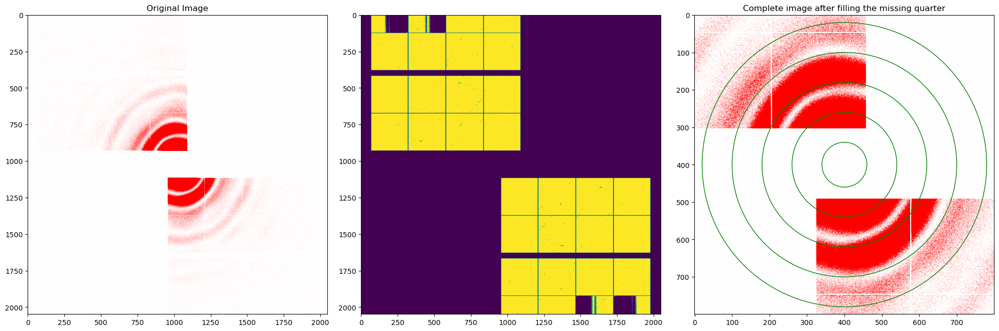

Time consumption for one center finding process is 6.704740047454834s
21
Reload
22
Reload
center shift (Δy, Δx) by iterative center of mass method = [-2.5 15.5]
Memory Usage: 4.749GB


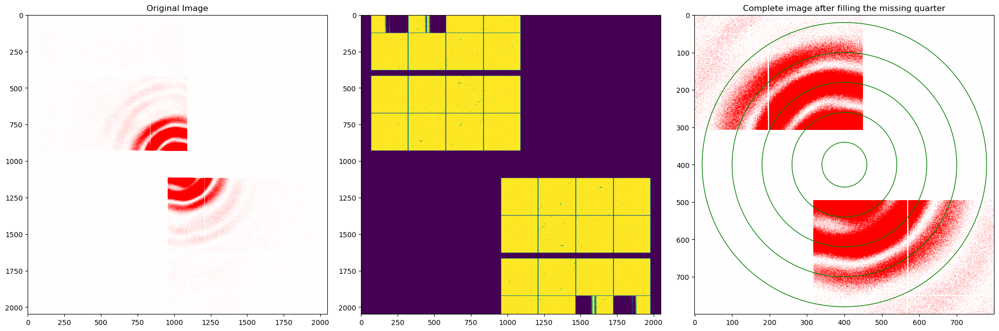

Time consumption for one center finding process is 6.654283761978149s
23
Reload
24
Reload
25
Reload
26
Reload
center shift (Δy, Δx) by iterative center of mass method = [2.  4.5]
Memory Usage: 4.749GB


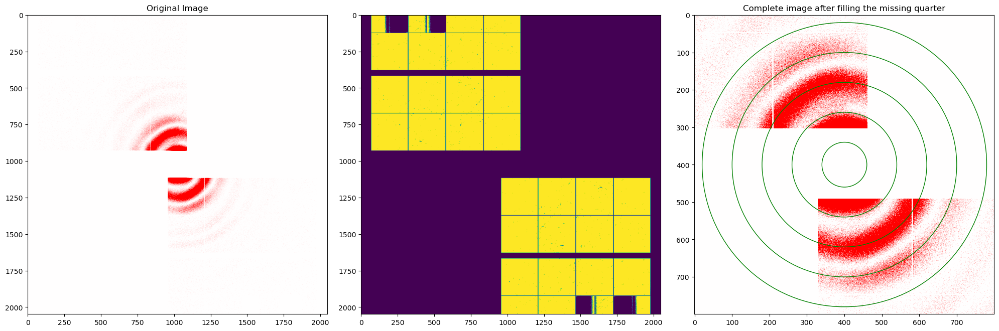

Time consumption for one center finding process is 6.716251373291016s
27
Reload
28
Reload
29
Reload
center shift (Δy, Δx) by iterative center of mass method = [0.5 7. ]
Memory Usage: 4.75GB


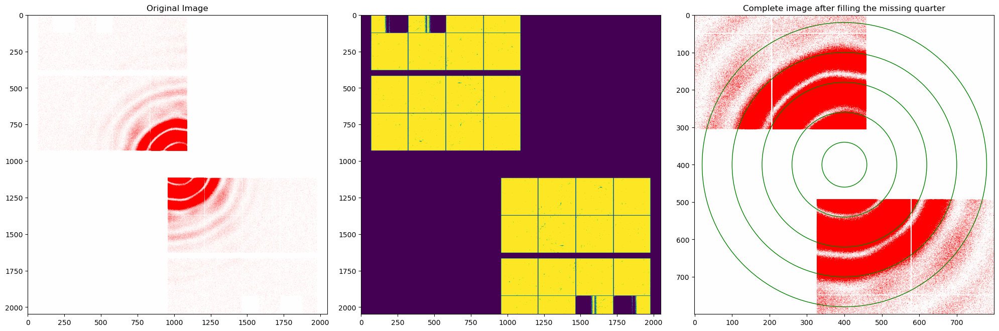

Time consumption for one center finding process is 6.6895201206207275s
30
Reload
1/21
31
Reload
32
Reload
33
Reload
34
Reload
center shift (Δy, Δx) by iterative center of mass method = [-3.  4.]
Memory Usage: 4.75GB


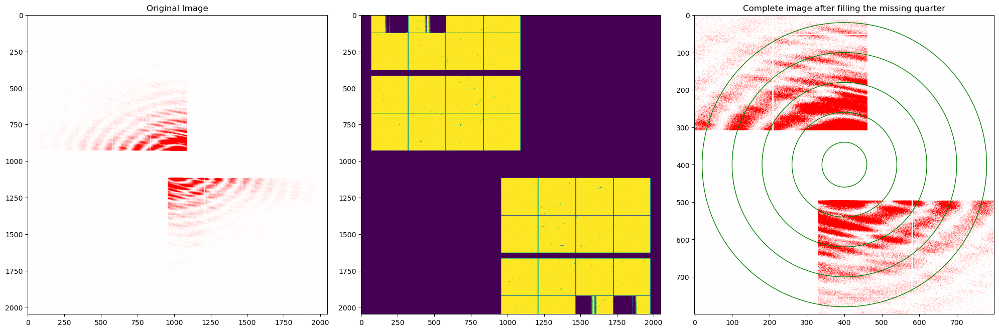

Time consumption for one center finding process is 6.662497282028198s
35
Reload
center shift (Δy, Δx) by iterative center of mass method = [2.5 5.5]
Memory Usage: 4.749GB


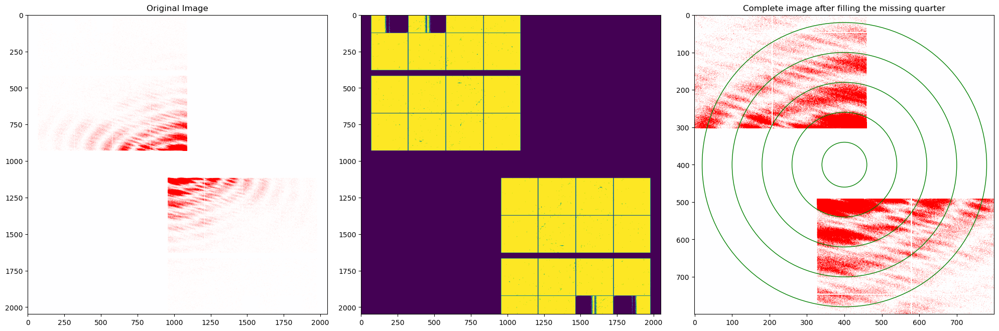

Time consumption for one center finding process is 6.700313091278076s
36
Reload
center shift (Δy, Δx) by iterative center of mass method = [0.5 0.5]
Memory Usage: 4.749GB


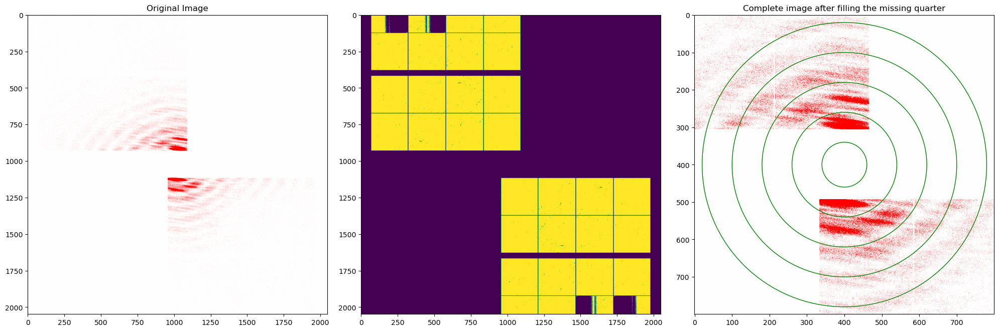

Time consumption for one center finding process is 6.751814603805542s
37


KeyboardInterrupt: 

In [92]:
# Pilot Dynamic Data

def Preprocess3(pattern, bkg, JFMask):

    # Prepare Mask, identify non-response pixels and hot pixels
    SpecificMask = pattern == 0
    GeoMask = ~(parameters.Quarter1|parameters.Quarter4|parameters.Quarter3)
    BadPixMask = bad_pixel.abnormal_pixels(pattern, JFMask|GeoMask|SpecificMask)
    final_mask = JFMask|SpecificMask|GeoMask|BadPixMask

    # Background subtraction
    img_minus_bkg = (pattern - bkg)*(~final_mask)

    # Common Mode Correction
    img_cmc = CMC.ComModCor_single(img_minus_bkg)[0]

    cy, cx = np.array(img_cmc.shape)//2
    cropsize = 2048
    half = cropsize//2
    
    img_crop  = img_cmc[cy-half:cy+half, cx-half:cx+half]
    img_flip = np.flip(img_crop)
    msk_crop  = final_mask[cy-half:cy+half, cx-half:cx+half].astype(bool)
    msk_flip  = np.flip(msk_crop)
    img_combine = img_crop*(~(msk_crop|msk_flip))
    image = img_combine.copy()
    # final_mask = msk_crop & msk_flip
    final_mask = ~(msk_crop|msk_flip)
    
    # Center Finding
    # asymmetry, center_shift = find_center.find_center_minimize_asymmetry(img_cmc, final_mask, cropsize=800)
    # center = np.array(pattern.shape)//2 + center_shift

    # return img_cmc, asymmetry, center_shift, final_mask

    center = find_center.phase_correlation_method(img_combine,np.array(img_combine.shape)//2,final_mask)

    return img_combine, center, final_mask

image_index = 0

for j, (Acq_File, Bkg_File) in enumerate(zip(Acq_Files, Bkg_Files)):
    print(f'Acquisition file {j}: {Acq_File}')
    bkg = 0 # initialization
    with h5py.File(Bkg_File, 'r') as bkgs:
        bkg = np.array(bkgs['/bg/image']).mean(0)
    
    with h5py.File(Acq_File, 'r') as acq:
        num_steps = acq['/LXT/LXT_Scan'].shape[0]
        for i in range(0, num_steps):
            print(f'{i}/{num_steps}')
            pattern_str = f'/jungfrau/pattern_{i}'
            pulseE_str = f'/gmd/pulse_ene_{i}'
            jf_images = acq[pattern_str]   # load jungfrau data

            for jf_img in jf_images:
                # if image_index < 2654:
                #     image_index += 1
                #     continue
                print(image_index)

                start = time.time()
                
                # img_cmc, asymmetry, center_shift, final_mask = Preprocess3(jf_img, bkg, JFMask)
                # center = np.array(img_cmc.shape)//2 + center_shift
                # print(f'center shift (Δy, Δx) by 4 quarters = {center_shift}')
                # print(f'centera shift (Δy, Δx) by 2 quarters = {center_shift_}')                
                img_cmc, center, final_mask = Preprocess3(jf_img, bkg, JFMask)
                if np.sum(img_cmc > 1)/(img_cmc.shape[0]*img_cmc.shape[1]) < 0.01:
                    image_index += 1
                    continue
                # if center is None:
                #     print('Cannot identify the center with iterative center of mass method')
                #     center = centers[-1]
                print(f'center shift (Δy, Δx) by iterative center of mass method = {center-np.array(img_cmc.shape)//2}')
                
                
                Memory_Usage()
    
                

    
                fig, axs = plt.subplots(1, 3, figsize=(20, 7))  # Adjust figsize for better layout
                
                # Plot data on each subplot
                axs[0].imshow(img_cmc, cmap='bwr', vmin = -3, vmax = 3)
                axs[0].set_title("Original Image")
                # print(asymmetry.shape)
                axs[1].imshow(final_mask)
                # axs[1].set_xticks(np.arange(-20, 21, 5))
                # axs[1].set_yticks(np.arange(-20, 21, 5))
                # axs[1].set_yticklabels(np.arange(-20, 21, 5)[::-1])     # Reverse the labels on the y-axis
            

                # centers = np.asarray(centers, dtype=float) - centers[0]
                # ys, xs = centers[:, 0], centers[:, 1]
            
                # # Draw the path
                # axs[1].plot(xs, ys, '-o', label='Path')
                # # Mark start and end
                # axs[1].scatter(xs[0], ys[0], s=100, marker='s', label='Start')
                # axs[1].scatter(xs[-1], ys[-1], s=100, marker='*', label='End')
                # axs[1].set_title('center converging path of iterative center-of-mass method')

                
                Cropsize = 801
                img_center_y, img_center_x = center
                img_center_y, img_center_x = int(round(img_center_y)), int(round(img_center_x))
                # print(f'center: {center}')
                half_cropsize = Cropsize // 2
            
                # Calculate cropping boundaries to keep the image center
                x_start = max(img_center_x - half_cropsize, 0)
                x_end = min(img_center_x + half_cropsize, img_cmc.shape[1])
                y_start = max(img_center_y - half_cropsize, 0)
                y_end = min(img_center_y + half_cropsize, img_cmc.shape[0])
            
                # Crop the image
                cropped_img = img_cmc[y_start:y_end, x_start:x_end]
            
                # Adjust center for cropping boundaries
                circle_center_y, circle_center_x = np.array([Cropsize, Cropsize])//2
                Num_Circ = 5
                
                axs[2].imshow(cropped_img, cmap='bwr', vmin = -3, vmax = 3)
                # axs[2].autoscale()
                axs[2].set_title("Complete image after filling the missing quarter")
            
                for i in range(Num_Circ):
                    radius = half_cropsize * (Num_Circ - i) / Num_Circ - 20
                    circle = plt.Circle((circle_center_y, circle_center_x), radius, color='green', fill=False)
                    axs[2].add_patch(circle)
                
                # Adjust layout for better spacing
                plt.tight_layout()
                
                # Show the plot
                plt.show()
                image_index += 1
                end = time.time()
                print(f'Time consumption for one center finding process is {end - start}s')
                



In [ ]:
# Pilot Dynamic Data
# Phase Correlation method
def Preprocess_PhaseCor(pattern, bkg, JFMask):

    # Prepare Mask, identify non-response pixels and hot pixels
    SpecificMask = pattern == 0
    GeoMask = ~(parameters.Quarter1|parameters.Quarter4|parameters.Quarter3)
    BadPixMask = bad_pixel.abnormal_pixels(pattern, JFMask|GeoMask|SpecificMask)
    final_mask = JFMask|SpecificMask|GeoMask|BadPixMask

    # Background subtraction
    img_minus_bkg = (pattern - bkg)*(~final_mask)

    # Common Mode Correction
    img_cmc = CMC.ComModCor_single(img_minus_bkg)[0]


    phase_unwrapped, center_shift_plot = find_center.phase_correlation(img_cmc, final_mask, center_guess=np.array(img_cmc.shape)//2, cropsize=2048)

    return img_cmc, phase_unwrapped, center_shift_plot, final_mask

image_index = 0

for j, (Acq_File, Bkg_File) in enumerate(zip(Acq_Files, Bkg_Files)):
    print(f'Acquisition file {j}: {Acq_File}')
    bkg = 0 # initialization
    with h5py.File(Bkg_File, 'r') as bkgs:
        bkg = np.array(bkgs['/bg/image']).mean(0)
    
    with h5py.File(Acq_File, 'r') as acq:
        num_steps = acq['/LXT/LXT_Scan'].shape[0]
        for i in range(0, num_steps):
            print(f'{i}/{num_steps}')
            pattern_str = f'/jungfrau/pattern_{i}'
            pulseE_str = f'/gmd/pulse_ene_{i}'
            jf_images = acq[pattern_str]   # load jungfrau data

            for jf_img in jf_images:

                start = time.time()
                
                # img_cmc, asymmetry, center_shift, final_mask = Preprocess3(jf_img, bkg, JFMask)
                # center = np.array(img_cmc.shape)//2 + center_shift
                # print(f'center shift (Δy, Δx) by 4 quarters = {center_shift}')
                # print(f'centera shift (Δy, Δx) by 2 quarters = {center_shift_}')                
                # img_cmc, centers, center, final_mask = Preprocess_PhaseCor(jf_img, bkg, JFMask)
                img_cmc, phase_unwrapped, center_shift_plot, final_mask = Preprocess_PhaseCor(jf_img, bkg, JFMask)
                if np.sum(img_cmc > 1)/(img_cmc.shape[0]*img_cmc.shape[1]) < 0.01:
                    continue

                # print(f'center shift (Δy, Δx) by iterative center of mass method = {center-centers[0]}')
                
                
                Memory_Usage()
    

    
                fig, axs = plt.subplots(1, 3, figsize=(20, 7))  # Adjust figsize for better layout
                
                # Plot data on each subplot
                axs[0].imshow(img_cmc, cmap='bwr', vmin = -3, vmax = 3)
                axs[0].set_title("Original Image")
                # print(asymmetry.shape)
                # axs[1].imshow(np.log(asymmetry), extent=[-20, 20, -20, 20])
                # axs[1].set_xticks(np.arange(-20, 21, 5))
                # axs[1].set_yticks(np.arange(-20, 21, 5))
                # axs[1].set_yticklabels(np.arange(-20, 21, 5)[::-1])     # Reverse the labels on the y-axis
            

                # centers = np.asarray(centers, dtype=float) - centers[0]
                # ys, xs = centers[:, 0], centers[:, 1]
            
                # Draw the path
                axs[1].imshow(phase_unwrapped)
                # Mark start and end
                # axs[1].scatter(xs[0], ys[0], s=100, marker='s', label='Start')
                # axs[1].scatter(xs[-1], ys[-1], s=100, marker='*', label='End')
                axs[1].set_title('phase plot')

                
                # Cropsize = 801
                # img_center_y, img_center_x = center
                # img_center_y, img_center_x = int(round(img_center_y)), int(round(img_center_x))
                # # print(f'center: {center}')
                # half_cropsize = Cropsize // 2
            
                # Calculate cropping boundaries to keep the image center
                # x_start = max(img_center_x - half_cropsize, 0)
                # x_end = min(img_center_x + half_cropsize, img_cmc.shape[1])
                # y_start = max(img_center_y - half_cropsize, 0)
                # y_end = min(img_center_y + half_cropsize, img_cmc.shape[0])
            
                # # Crop the image
                # cropped_img = img_cmc[y_start:y_end, x_start:x_end]
            
                # # Adjust center for cropping boundaries
                # circle_center_y, circle_center_x = np.array([Cropsize, Cropsize])//2
                # Num_Circ = 5
                
                axs[2].imshow(np.log(0.1+np.abs(center_shift_plot)), cmap='plasma')
                print(np.unravel_index(np.argmax(np.abs(center_shift_plot)), center_shift_plot.shape))
                print(np.max(np.abs(center_shift_plot)))
                print(np.min(np.abs(center_shift_plot)))
                # axs[2].autoscale()
                axs[2].set_title("Complete image after filling the missing quarter")
            
                # for i in range(Num_Circ):
                #     radius = half_cropsize * (Num_Circ - i) / Num_Circ - 20
                #     circle = plt.Circle((circle_center_y, circle_center_x), radius, color='green', fill=False)
                #     axs[2].add_patch(circle)
                
                # Adjust layout for better spacing
                plt.tight_layout()
                
                # Show the plot
                plt.show()
    
                end = time.time()
                print(f'Time consumption for one center finding process is {end - start}s')
                



In [ ]:
a = np.zeros((3, 3))
b = np.ones((3,3))
c = np.array([[1,2,3],[4,5,6],[7,8,9]])
print(a, b)
print(1 - np.array(a, dtype=bool)&np.array(b, dtype=bool))
print(np.argmax(c))